# Probav Super Resolution Example

This notebook is designed to be an introduction to the model and comparing the data to ground truth

In [1]:
import torch
from embiggen import *
import predict
import numpy as np
import utils
import probav_data as pd
import train
import skimage
from utils import device

## Loading the model and getting the dataset

In [2]:
model = torch.load('models/inference_306.pt').to(device)
data_paths = all_scenes_paths('probav_data/train')

In [3]:
info = train.getFullTrainingInfo(data_paths, False, False)
dataset = pd.ProbaVDataset(info)
images_to_check = 10

## Predict result and score the images

In [4]:
scores, images = predict.runToScore(model, dataset, data_paths, images_to_check)

In [5]:
print(scores)

[1.011137556886178, 0.9866844422312293, 1.0063148406106275, 1.0244395753355766, 0.9685601456006386, 0.9858912230143817, 1.0118266197010664, 0.9678925606656973, 1.1206675994349045, 0.9988302312937508]


## Comparing with ground truth

In [6]:
import matplotlib.pyplot as plt

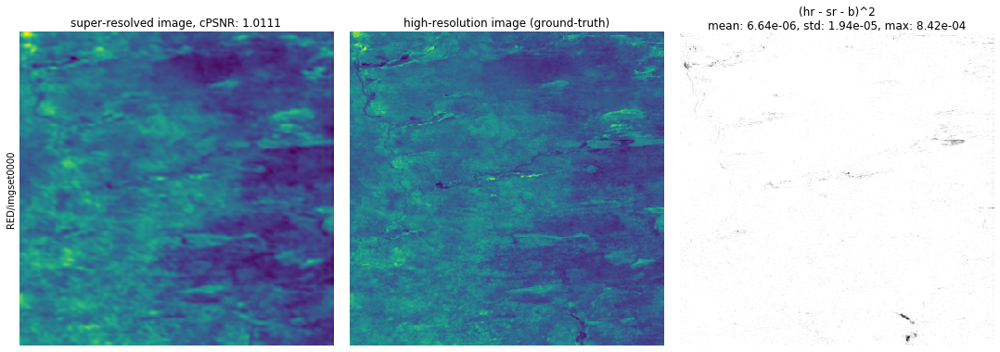

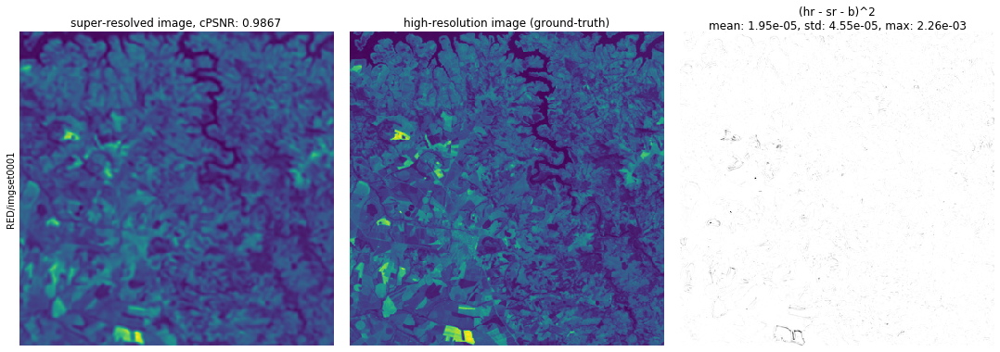

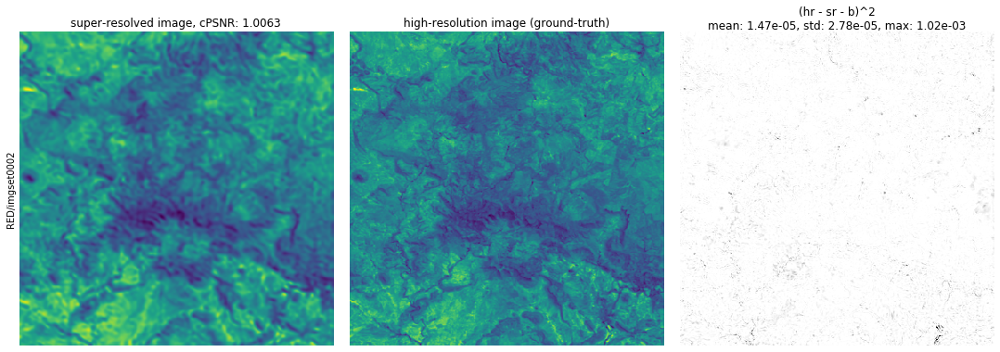

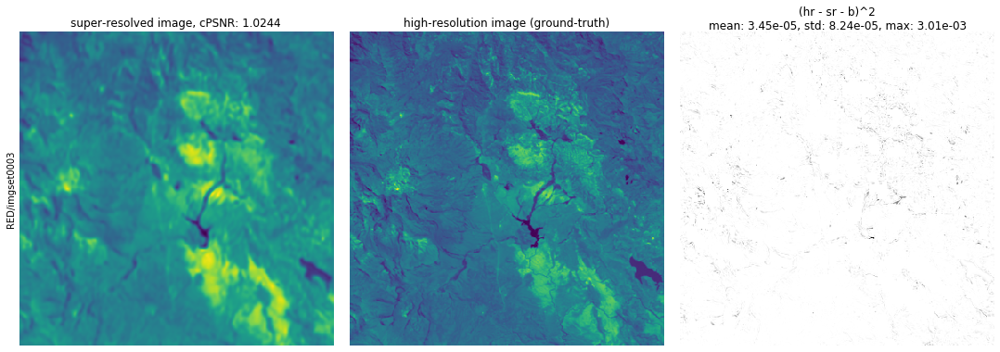

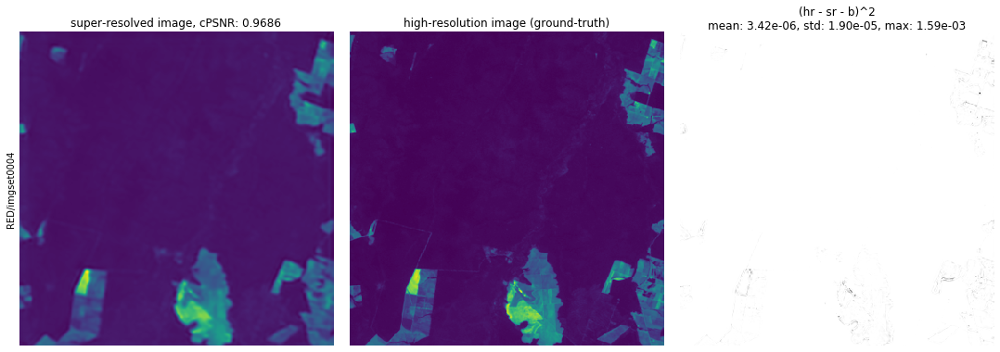

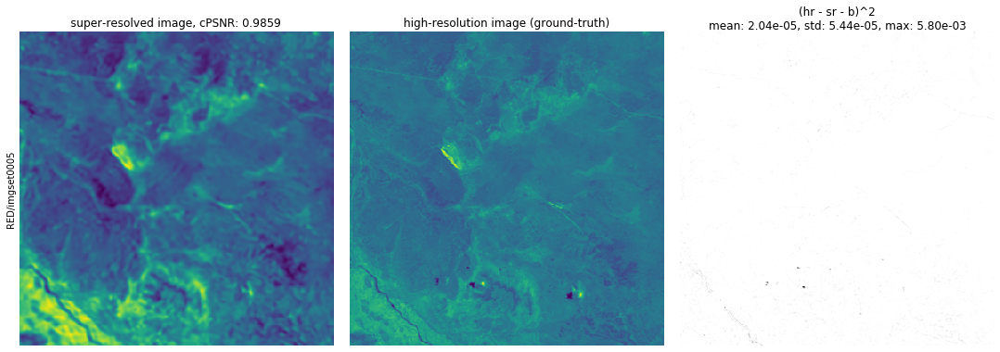

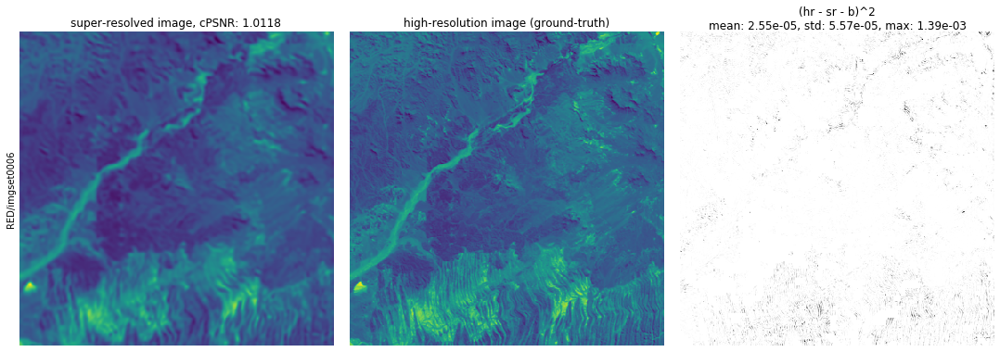

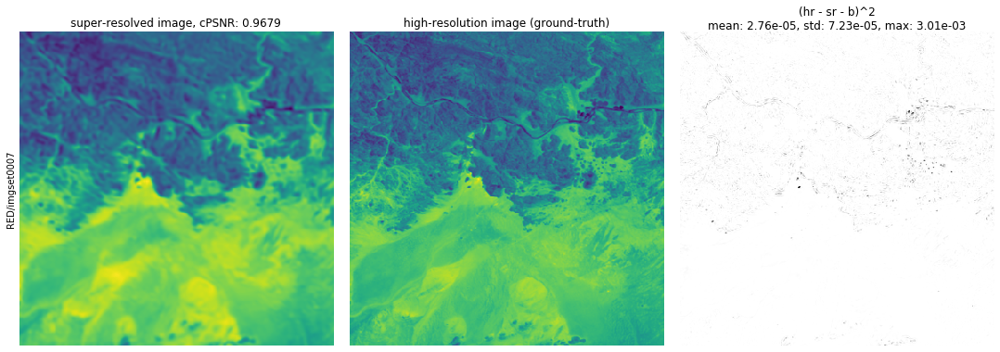

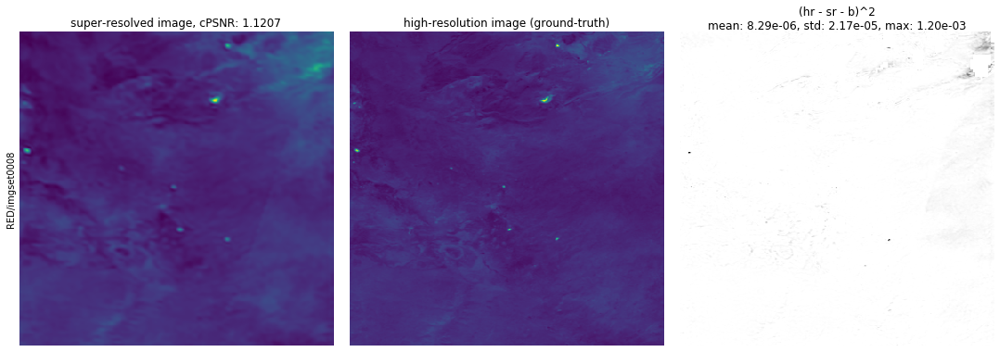

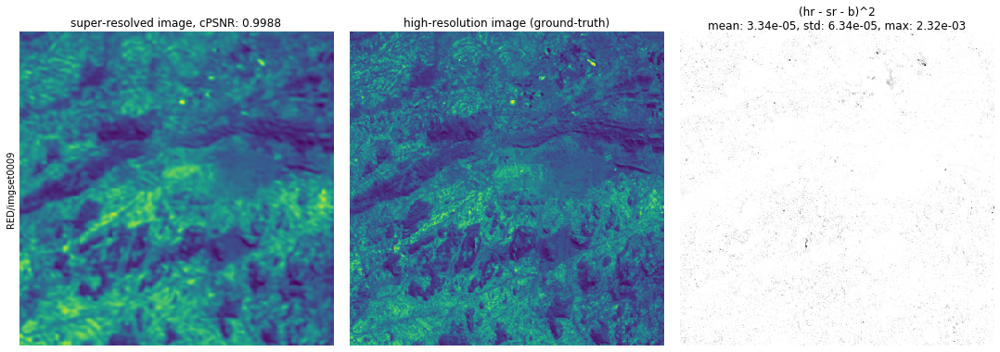

In [7]:
for i in range(images_to_check):
    image_to_plot = skimage.img_as_float64(images[i]) #The network runs on float32 to reduce training time and complexity
    fig,axs = compare_to_hr(image_to_plot, data_paths[i])

## Let's get the baseline as well as the ensemble with the baseline

In [8]:
images_bicubic = utils.bicubicUpsample('probav_data/train', 10)
bicubic_scores = []
for i in range(images_to_check):
    bicubic_scores.append(score_image(images_bicubic[i], data_paths[i]))

In [9]:
images_ensemble = utils.ensemble(images, images_bicubic)
ensemble_scores = []
for i in range(images_to_check):
    ensemble_scores.append(score_image(images_ensemble[i], data_paths[i]))

In [10]:
hr_images = []
for i in range(images_to_check):
    hr, _ = highres_image(data_paths[i])
    hr_images.append(hr)

## Now lets compare them all with the HR ground truth

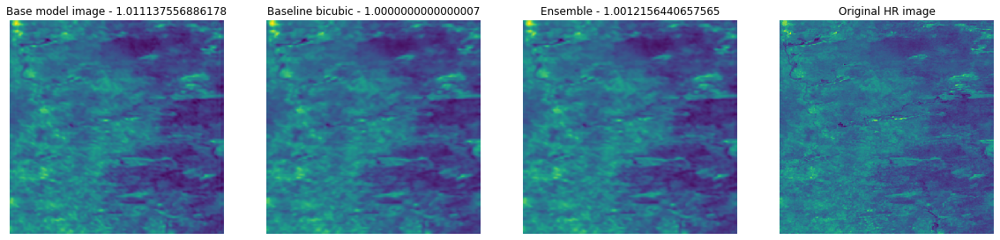

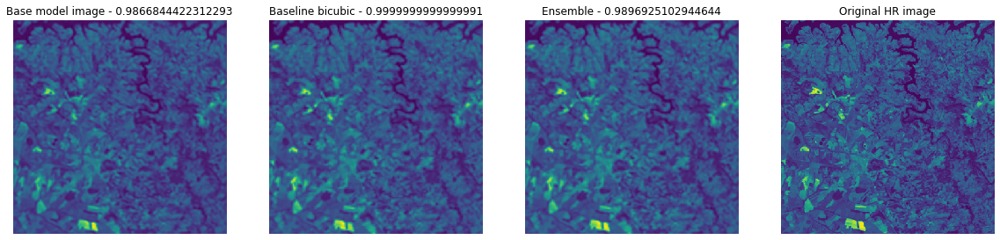

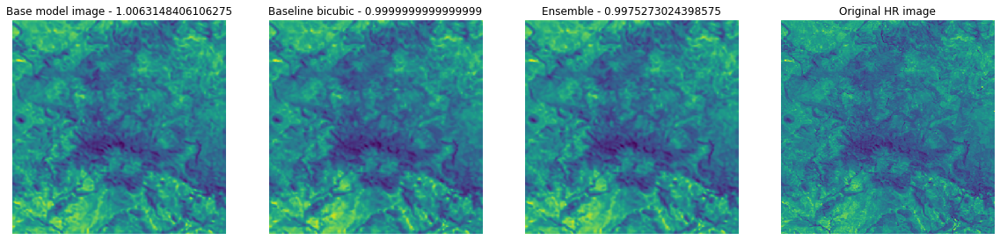

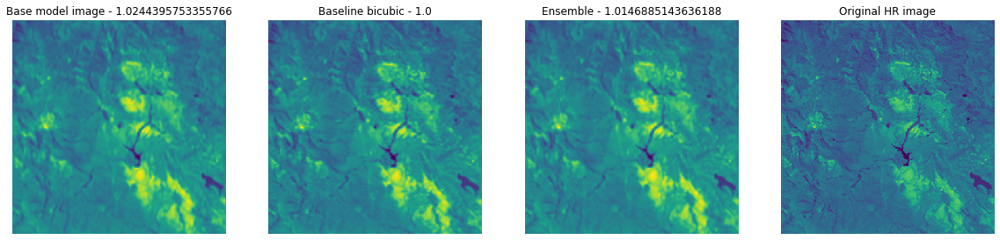

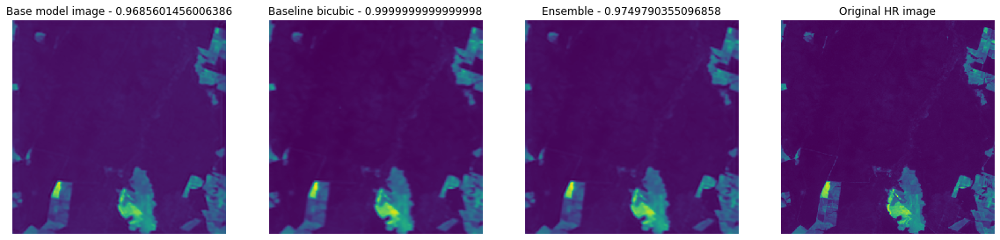

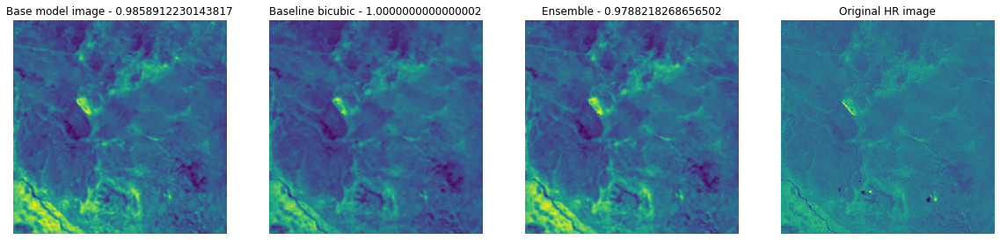

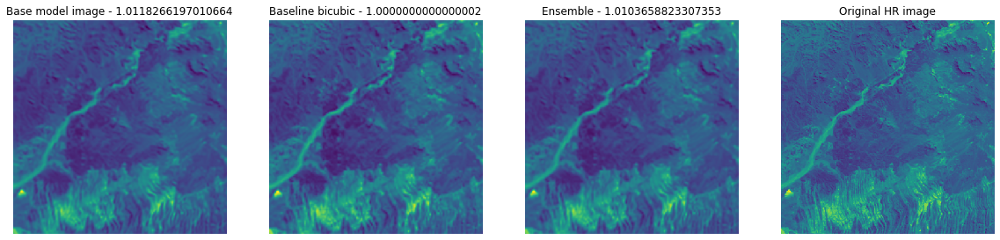

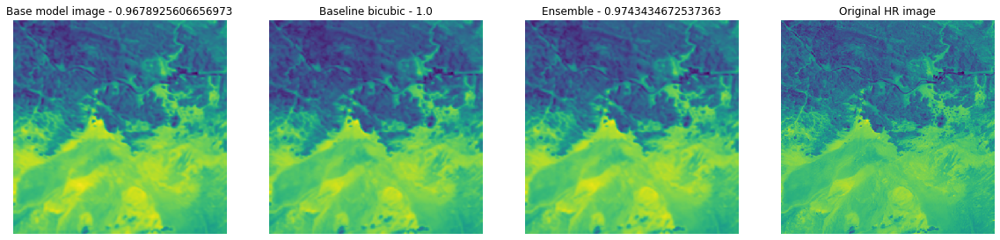

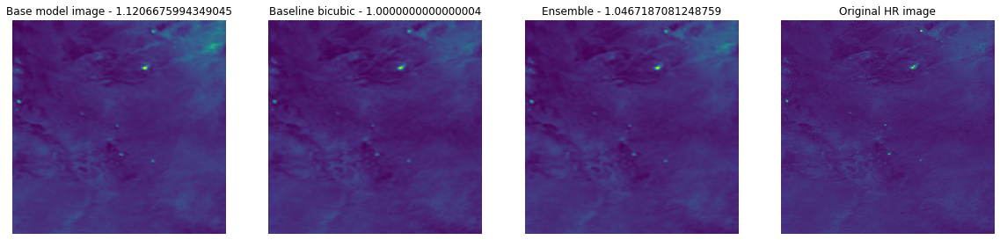

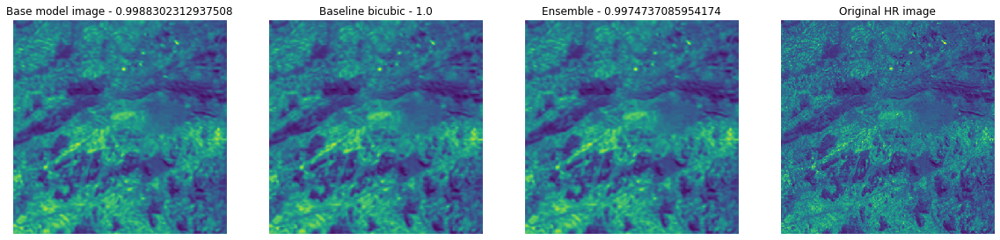

In [11]:
ax_cfg = dict(xticks=[], yticks=[], aspect='equal', frame_on=False)
for i in range(images_to_check):
    fig, ax = plt.subplots(1,4, figsize=(20,5),subplot_kw=ax_cfg)
    ax[0].imshow(skimage.img_as_float64(images[i]))
    ax[0].set_title('Base model image - {}'.format(scores[i]))
    ax[1].imshow(skimage.img_as_float64(images_bicubic[i]))
    ax[1].set_title('Baseline bicubic - {}'.format(bicubic_scores[i]))
    ax[2].imshow(skimage.img_as_float64(images_ensemble[i]))
    ax[2].set_title('Ensemble - {}'.format(ensemble_scores[i]))
    ax[3].imshow(skimage.img_as_float64(hr_images[i]))
    ax[3].set_title('Original HR image')
    plt.savefig('plt_{}.jpg'.format(i))

    